# CharCoLab: 
## Multi-Agents Collaboration System for Character Design
### Quinn Wang, 21000873, 09/2024


### 0 Import

In [1]:
import json
import os
import pdb
import random
import re
import time
from typing import Any, Callable, Dict, List, Optional, Tuple, Type, Union

import matplotlib.pyplot as plt
import PIL
import requests
from diskcache import Cache
from openai import OpenAI
from PIL import Image
from termcolor import colored

import autogen
from autogen import Agent, AssistantAgent, ConversableAgent, UserProxyAgent
from autogen.agentchat.contrib.img_utils import _to_pil, get_image_data, get_pil_image, gpt4v_formatter
from autogen.agentchat.contrib.multimodal_conversable_agent import MultimodalConversableAgent

In [2]:
config_list_4v = autogen.config_list_from_json(
    "OAI_CONFIG_LIST",
    filter_dict={
        "model": ["gpt-4o"],
    },
)

config_list_gpt4 = autogen.config_list_from_json(
    "OAI_CONFIG_LIST",
    filter_dict={
        "model": ["gpt-4", "gpt-4o"],
    },
)

config_list_dalle = autogen.config_list_from_json(
    "OAI_CONFIG_LIST",
    filter_dict={
        "model": ["dalle"],
    },
)

gpt4_llm_config = {"config_list": config_list_gpt4, "cache_seed": 42}

### 1 Env Set

In [3]:
def dalle_call(client: OpenAI, model: str, prompt: str, size: str, quality: str, n: int) -> str:
    cache = Cache(".cache/") 
    key = (model, prompt, size, quality, n)
    if key in cache:
        return cache[key]

    response = client.images.generate(
        model=model,
        prompt=prompt,
        size=size,
        quality=quality,
        n=n,
    )
    image_url = response.data[0].url
    img_data = get_image_data(image_url)
    cache[key] = img_data

    return img_data

In [4]:
def extract_img(agent: Agent) -> PIL.Image:
    last_message = agent.last_message()["content"]

    if isinstance(last_message, str):
        img_data = re.findall("<img (.*)>", last_message)[0]
    elif isinstance(last_message, list):
        assert isinstance(last_message[0], dict)
        img_data = last_message[0]["image_url"]["url"]

    pil_img = get_pil_image(img_data)
    return pil_img

In [5]:
class DALLEAgent(ConversableAgent):
    def __init__(self, name, llm_config: dict, **kwargs):
        super().__init__(name, llm_config=llm_config, **kwargs)

        try:
            config_list = llm_config["config_list"]
            api_key = config_list[0]["api_key"]
        except Exception as e:
            print("Unable to fetch API Key, because", e)
            api_key = os.getenv("OPENAI_API_KEY")
        self._dalle_client = OpenAI(api_key=api_key)
        self.register_reply([Agent, None], DALLEAgent.generate_dalle_reply)

    def send(
        self,
        message: Union[Dict, str],
        recipient: Agent,
        request_reply: Optional[bool] = None,
        silent: Optional[bool] = False,
    ):
        super().send(message, recipient, request_reply, silent=True)

    def generate_dalle_reply(self, messages: Optional[List[Dict]], sender: "Agent", config: Optional[Dict]):
        client = self._dalle_client if config is None else config
        if client is None:
            return False, None
        if messages is None:
            messages = self._oai_messages[sender]

        prompt = messages[-1]["content"]
        img_data = dalle_call(
            client=client,
            model="dall-e-3",
            prompt=prompt,
            size="1024x1024",
            quality="hd",
            n=1,
        )

        img_data = _to_pil(img_data)

        return True, {"content": [{"type": "image_url", "image_url": {"url": img_data}}]}

### 2 Agent Prompting

#### 2.1 Main Specialized Agents

In [6]:
# Train all the agents using prompt engineering
ConceptAgent_Def = """
    You are one of the members of character design team, specialized in creating innovative and engaging character concepts.

    ### Your Main task:
    Create an appealing and detailed character concept based on the initial prompt. Your output should include:

    - **Backstory**: Craft a detailed backstory for the character, including their origins, key life events, significant relationships, hobbies, and any unique experiences that shaped their personality.
    - **Personality Traits**: Determine descriptors like brave, comical, shy, and adventurous that will influence their actions and dialogue.
    - **Motivations**: Establish the driving goals, desires, and conflicts that propel the character through the story. Motivations inform their arc.
    - **Mannerisms**: Come up with signature habitual behaviors, gestures, postures, and quirks that reflect personality.

    ### Format:
    - Personality Traits: 
    - Backstory:
    - Motivations:
    - Mannerisms: 

    ### Your Secondary task:
    When you are added into a group chat, discuss with other team members based on the specific task.
    Stay critic and raise adjustment based on your design concept of the character.
    """

SketchAgent_Def = """
    You are one of the members of character design team, with a focus on creating detailed and engaging character sketches based on concepts provided by ConceptAgent.

    ### Your main task:
    Create black-and-white sketches of the character, emphasizing a clear and dynamic silhouette, a pose that reflects their personality, and key features that align with their role in the story.
    Your sketch output should include:
    1. **Sketch Description:** Describe the sketch in detail, covering the character's silhouette, pose, expression, and key features.
    2. **Design Rationale:** Integrate the concept to explain the reasons behind your design choices, such as how they reflect the character's personality and role within the story.

    ### Your secondary task:
    When you are added into a group chat, discuss with other team members based on the specific task.
    Stay critic and raise adjustment based on the design concept of your sketch.
    """

ColorAgent_Def = """
    You are one of the members of character design team, specializing in select appealing color pallete to character visualisation. 

    ### Your main task:
    Select a color scheme based on the sketch to reflect the character’s concept and enhance their visual impact.

    ### Requirements:
    1. **Color Selection**: Choose 3-5 core colors that reflect the character’s personality, backstory, and role, and make the character visually striking.
    2. **Silhouette Recognition**: Ensure the colors enhance the character’s silhouette, making them distinct and easily recognizable.
    3. **Balance and Flexibility**: The color scheme should be distinct yet adaptable, working well in different lighting and environments.

    ### Output:
    Provide the following details:
    1. The core colors selected for the character.
    2. How the colors combine and interact.

    ### Additional Notes:
    - Prioritize color combinations that enhance the character's design and visual storytelling.
    - Ensure the colors are both aesthetically pleasing and functional, supporting the character's role and narrative.

    ### Your secondary task:
    When you are added into a group chat, discuss with other team members based on the specific task.
    Stay critic and raise adjustment based on the design concept of your color choice.
    """

RefineAgent_Def = """
    You are one of the members of character design team, focused on refining and enhancing character details to achieve the highest quality and consistency across all views.

    ### Your main task:
    Refine and enhance subtle details like textures, shading, and fine features to improve the character's overall visual quality and appeal.

    ### Output:
    Provide the following details:
    1. The enhancements made to the character’s details, such as textures, shading, and fine features.
    2. The reason for these enhancements, explaining how they improve the character's visual quality and consistency.

    ### Additional Notes:
    - Ensure alignment and proportion of details are consistent across all views for a uniform and polished design.
    - Focus on enhancements that elevate the character's visual impact, making the design both functional and aesthetically pleasing.

    ### Your secondary task:
    When you are added into a group chat, discuss with your team members to adjust details refinement, taking their design concept as the reference.
    """

CriticAgent_Def = """
    You are an experienced critic in the area of character design, specializing in providing constructive feedback and suggestions to enhance the overall quality and consistency of character designs.

    ### Your main task:
    Critique the character design based on the concept, sketch, color choices, and details refinement provided by the team members. 
    Your feedback should focus on improving the character's visual appeal, consistency, and alignment with the concept, taking into account the genre (e.g., fantasy, sci-fi), market trends, and audience preferences.
    Provide clear, actionable suggestions, and aim to balance candid critique with supportive guidance.

    """

SituationAgent_Def = """
    You are an experienced character designer specializing in creating dynamic poses and situations that align with the character’s storyline.

    ### Your main task:
    Your task is to create a vivid scene that combines the character’s design from the image with a dynamic situation that fits their storyline.

    ### Steps:
    1. **Character Action**: Based on the image, place the character in an action that aligns with their story (e.g., an elf running swiftly through a dense forest). The action should express their personality and emotions (e.g., determination, urgency, joy).
    2. **Story Integration**: Ensure the scene reflects the narrative context from the text. For example, if the character is on a mission, the environment and action should reflect that mission (e.g., the elf is dodging obstacles in the forest to escape danger or reach a hidden location).

    ### Additional Notes:
    - Focus on enhancing the **visual impact** of the scene, making sure the character is functional, aesthetically pleasing, and stays true to their concept.
    - **Shading, lighting**, and **backgrounds** should complement the mood of the character's pose and enhance the overall design.
    """

#### 2.2 Assistant Functional Agents

In [7]:
IntegrateTextAgent_Def = """
    You are a skilled prompt engineer specialized in integrating and summarizing all key aspects of character design into a cohesive and concise prompt for Dall-E 3 image generation.

    ### Output:
    - The final integrated prompt should be no more than 300 words.
    - Ensure that the prompt is visually descriptive and specific, enabling DALL-E 3 to generate a highly accurate and detailed character image.
    - Use clear and direct language, focusing on elements that are crucial for visual rendering.
    """

ImageAgent_Def = """
    You are a skilled character designer tasked with drawing a high-quality, consistent character based on the input prompt. 
                
    ### Requirements:
    Accurately execute the requirements described in the input prompt to create a character design, including sketches, colored version, and detailed character.
    If there is any image in the prompt, please use it to a great extend as a reference to create the character design.

    ### Output:
    Your final output should include the whole view of the character: **Full-Body ‘A’ Pose View (Head to Toe) in a neutral 'A' pose**.

    ### Additional Notes:
    Maintain a high level of consistency and quality across all character designs.
    """

In [8]:
Prompt_rules = """
1. **Use Descriptive Adjectives**: Incorporate specific descriptive adjectives to bring clarity and detail to the output.
2. **Avoid Sensitive Language**: Refrain from using terms like "naked," "murder," "sexy," or any other words that could be interpreted as violent, explicit, or offensive.
3. **Layering Elements**: Combine multiple elements thoughtfully by adding layers to the description, ensuring depth and richness in the final output.
4. **Maintain Positive Focus**: Ensure the generated content promotes creativity, positivity, and constructive imagery.
5. **Prohibit Harmful Content**: Avoid creating or suggesting violent, harmful, or inappropriate content under any circumstances.
    """

### 3 Workflow Assembly

In [9]:
class DalleCreator(AssistantAgent):
    def __init__(self, n_iters=2, **kwargs):
        super().__init__(**kwargs)
        self.register_reply([Agent, None], reply_func=DalleCreator._reply_user, position=0)
        self._n_iters = n_iters

    def _reply_user(self, messages=None, sender=None, config=None):
        if all((messages is None, sender is None)):
            error_msg = f"Either {messages=} or {sender=} must be provided."
            logger.error(error_msg)  # noqa: F821
            raise AssertionError(error_msg)

        if messages is None:
            messages = self._oai_messages[sender]

        img_prompt = messages[-1]["content"]

        self.ConceptAgent = MultimodalConversableAgent(
            name="ConceptAgent",
            system_message=f"""{ConceptAgent_Def}
            General Rules: {Prompt_rules}""",
            llm_config={"config_list": config_list_4v, "max_tokens": 1000},
            human_input_mode="NEVER",
            max_consecutive_auto_reply=3,
        )

        self.SketchAgent = MultimodalConversableAgent(
            name="SketchAgent", 
            system_message=f"""{SketchAgent_Def}
            General Rules: {Prompt_rules}""",
            llm_config={"config_list": config_list_4v, "max_tokens": 1000}, 
            human_input_mode="NEVER",
            max_consecutive_auto_reply=3,
        )

        self.ColorAgent = MultimodalConversableAgent(
            name="ColorAgent", 
            system_message=f"""{ColorAgent_Def}
            General Rules: {Prompt_rules}""",
            llm_config={"config_list": config_list_4v, "max_tokens": 1000}, 
            human_input_mode="NEVER",
            max_consecutive_auto_reply=3,
        )

        self.RefineAgent = MultimodalConversableAgent(
            name="RefineAgent", 
            system_message=f"""{RefineAgent_Def}
            General Rules: {Prompt_rules}""",
            llm_config={"config_list": config_list_4v, "max_tokens": 1000}, 
            human_input_mode="NEVER",
            max_consecutive_auto_reply=3,
        )

        self.CriticAgent = MultimodalConversableAgent(
            name="CriticAgent", 
            system_message=f"""{CriticAgent_Def}
            General Rules: {Prompt_rules}""",
            llm_config={"config_list": config_list_4v, "max_tokens": 1000}, 
            human_input_mode="NEVER",
            max_consecutive_auto_reply=3,
        )

        self.SituationAgent = MultimodalConversableAgent(
            name="SituationAgent", 
            system_message= f"""{SituationAgent_Def}
            General Rules: {Prompt_rules}""",
            llm_config={"config_list": config_list_4v, "max_tokens": 1000}, 
            human_input_mode="NEVER",
            max_consecutive_auto_reply=3,
        )
        
        self.IntegrateTextAgent = MultimodalConversableAgent(
            name="IntegrateTextAgent", 
            system_message=f"""{IntegrateTextAgent_Def}
            General Rules: {Prompt_rules}""",
            llm_config={"config_list": config_list_4v, "max_tokens": 1000}, 
            human_input_mode="NEVER",
            max_consecutive_auto_reply=3,
        )

        self.ImageAgent = DALLEAgent(
            name="ImageAgent", 
            system_message=f"""{ImageAgent_Def}""",
            llm_config={"config_list": config_list_dalle}, max_consecutive_auto_reply=0,
        )


        # Step 1: Generate character concept
        concept_prompt = f"""{img_prompt} Create a character concept based on the prompt provided. No more than 300 words."""
        self.send(message={"content": concept_prompt, "system_message": self.ConceptAgent.system_message}, recipient=self.ConceptAgent, request_reply=True)
        concept_response = self._oai_messages[self.ConceptAgent][-1]["content"]

        # Step 2: Generate sketches based on the character concept
        sketch_prompt = f"""Based on the concept:{concept_response} to create a black-and-white sketch. Describe and explain it for image creation. No more than 300 words."""
        self.send(message={"content": sketch_prompt, "system_message": self.SketchAgent.system_message}, recipient=self.SketchAgent, request_reply=True)
        sketch_response = self._oai_messages[self.SketchAgent][-1]["content"]

        sketch_image_prompt = f"""Create a black-and-white sketch of the character based on the description:{sketch_response}"""
        self.send(message={"content": sketch_image_prompt, "system_message": self.ImageAgent.system_message}, recipient=self.ImageAgent, request_reply=True)
        sketch_img = extract_img(self.ImageAgent)
        sketch_img.save("sketch_image.png")
        plt.imshow(sketch_img)
        #plt.title("Sketch")
        plt.axis("off")
        plt.show()
        
        # Step 3: Start a group chat between sketch and color agents to generate color choices
        task_1 = f"""Based on the following sketch description {sketch_response} and the character concept {concept_response}, 
        discuss and decide on the color palette choices for the character. 
        """

        def color_speaker_selection_func(last_speaker: Agent, groupchat: autogen.GroupChat):
            if last_speaker == self.SketchAgent:
                return self.ColorAgent
            if last_speaker == self.ColorAgent:
                return self.SketchAgent
            return 'round_robin'

        groupchat_1 = autogen.GroupChat(
            agents=[self.SketchAgent, self.ColorAgent],
            messages=[],
            max_round=4,
            speaker_selection_method=color_speaker_selection_func,
        )  
        manager_1 = autogen.GroupChatManager(groupchat=groupchat_1, name="Color_manager", llm_config={"config_list": config_list_4v})
        self.SketchAgent.initiate_chat(manager_1, message=task_1)
        color_select = groupchat_1.messages[-1]["content"]

        color_text_prompt = f"""Summarize the discussion in {color_select} and 
        Generate a coherent prompt for dall-e-3 to create the colored version of the character in the following image <img sketch_image.png>. 
        No more than 300 words."""
        self.send(message={"content": color_text_prompt, "system_message": self.IntegrateTextAgent.system_message}, recipient=self.IntegrateTextAgent, request_reply=True)
        color_text_response = self._oai_messages[self.IntegrateTextAgent][-1]["content"]
        
        color_image_prompt = f"""Create the colored character design in the whole view (head-to-toe). Stay highly consistent in the following image <img sketch_image.png>, based on the color description in: {color_text_response} . """
        self.send(message={"content": color_image_prompt, "system_message": self.ImageAgent.system_message}, recipient=self.ImageAgent, request_reply=True)
        color_img = extract_img(self.ImageAgent)

        color_img.save("color_image.png")
        plt.imshow(color_img)
        # plt.title("Color-focused Image")
        plt.axis("off")
        plt.show()

        # Step 4: Start a group chat between concept, sketch, color and refine agents to refine the details
        task_2 = f"""Based on the following character concept {concept_response}, sketch description {sketch_response} and the color choices {color_text_response}, 
        discuss and decide on the details refinement for the character. 
        """

        def refine_speaker_selection_func(last_speaker: Agent, groupchat: autogen.GroupChat):
            if last_speaker == self.ColorAgent:
                return self.RefineAgent
            if last_speaker == self.RefineAgent:
                return self.ConceptAgent
            if last_speaker == self.ConceptAgent:
                return self.SketchAgent
            if last_speaker == self.SketchAgent:
                return self.ColorAgent
            return 'round_robin'

        groupchat_2 = autogen.GroupChat(
            agents=[self.ConceptAgent, self.SketchAgent, self.ColorAgent, self.RefineAgent],
            messages=[],
            max_round=6,
            speaker_selection_method=refine_speaker_selection_func,
        )  
        manager_2 = autogen.GroupChatManager(groupchat=groupchat_2, name="Refine_manager", llm_config={"config_list": config_list_4v})
        self.ColorAgent.initiate_chat(manager_2, message=task_2)
        Refine_desc = groupchat_2.messages[-1]["content"]

        refine_text_prompt = f"""Summarize the discussion in {Refine_desc} and 
        Generate a coherent prompt for dall-e-3 to create the detailed version of the character in the following image <img color_image.png>. 
        No more than 300 words."""
        self.send(message={"content": refine_text_prompt, "system_message": self.IntegrateTextAgent.system_message}, recipient=self.IntegrateTextAgent, request_reply=True)
        refine_text_response = self._oai_messages[self.IntegrateTextAgent][-1]["content"]
        
        refine_image_prompt = f"""Create the refined character design in the whole view (head-to-toe) and stay highly consistent in the following image <img color_image.png>, based on the detailed refinement in: {refine_text_response}. """
        self.send(message={"content": refine_image_prompt, "system_message": self.ImageAgent.system_message}, recipient=self.ImageAgent, request_reply=True)
        refine_img = extract_img(self.ImageAgent)

        refine_img.save("refine_image.png")
        plt.imshow(refine_img)
        # plt.title("Refined Image")
        plt.axis("off")
        plt.show()

        # Step 5: Critic agents critique the design
        critic_prompt = f"""Critique the character design in the following image <img refine_image.png>, based on the concept, sketch, color choices, and details refinement provided by the team members.
        Provide feedback on how to improve the character's visual appeal, consistency, and alignment with the concept.
        """
        self.send(message={"content": critic_prompt, "system_message": self.CriticAgent.system_message}, recipient=self.CriticAgent, request_reply=True)
        critic_response = self._oai_messages[self.CriticAgent][-1]["content"]
        
        critic_text_prompt = f"""Based on the criticism: {critic_response}, regenerate the prompt: {refine_text_response}.
        The final prompt will be used to create a focused-whole-view character consistent in the following image <img refine_image.png>. 
        No more than 300 words."""
        self.send(message={"content": critic_text_prompt, "system_message": self.IntegrateTextAgent.system_message}, recipient=self.IntegrateTextAgent, request_reply=True)
        critic_text_response = self._oai_messages[self.IntegrateTextAgent][-1]["content"]
        
        critic_image_prompt = f"""Create the advanced character highly consistent in the following image <img refine_image.png>, based on the improved description in: {critic_text_response}. 
        The generated image should focus on the whole view of the character clearly, in full color and with high attention to detail.
        """
        self.send(message={"content": critic_image_prompt, "system_message": self.ImageAgent.system_message}, recipient=self.ImageAgent, request_reply=True)
        critic_img = extract_img(self.ImageAgent)

        critic_img.save("critic_image.png")
        plt.imshow(critic_img)
        # plt.title("Critic Image")
        plt.axis("off")
        plt.show()

        #Step 6: Create narrative scenes 
        situation_text_prompt = f"""Create a vivid narrative scene for the coherent character in the following image: <img critic_image.png>, based on character description {critic_text_response} and the back story {concept_response}.
        The final prompt should describe the character in the whole view (head-to-toe) in an appealing background that reflect the story in details.
        No more than 300 words."""
        self.send(message={"content": situation_text_prompt, "system_message": self.SituationAgent.system_message}, recipient=self.SituationAgent, request_reply=True)
        situation_text_response = self._oai_messages[self.SituationAgent][-1]["content"]
        
        situation_image_prompt = f"""Create the narrative scene for the character highly consistent in the following image <img critic_image.png>, based on the story statement in: {situation_text_response}. 
        The generated image should show the character in an appealing background that reflect the story in details.
        """
        self.send(message={"content": situation_image_prompt, "system_message": self.ImageAgent.system_message}, recipient=self.ImageAgent, request_reply=True)
        situation_img = extract_img(self.ImageAgent)
        
        situation_img.save(f"situation_img.png")
        plt.imshow(situation_img)
        # plt.title(f"Situation Image")
        plt.axis("off")
        plt.show()

        return True, "result.jpg"

### 4 Experiment and Results

In [10]:
creator = DalleCreator(
    name="DALLE Creator!",
    max_consecutive_auto_reply=0,
    system_message="Help me coordinate generating image",
    llm_config=gpt4_llm_config,
)

User (to DALLE Creator!):

Design an elf cartoon sytle.

--------------------------------------------------------------------------------
DALLE Creator! (to ConceptAgent):

Design an elf cartoon sytle. Create a character concept based on the prompt provided. No more than 300 words.

--------------------------------------------------------------------------------
ConceptAgent (to DALLE Creator!):

### Personality Traits:
- Brave
- Curious
- Cheerful
- Adventurous
- Resourceful

### Backstory:
Eldoria Evergreen hails from the mystical Forest of Thaloria, a place where ancient trees touch the sky and wildlife thrives in harmony. Born to the wise elder, Lyren Evergreen, and the renowned herbalist, Elara Evergreen, Eldoria exhibited a special connection to nature from a young age. She learned the arts of healing and potion-making from her mother and honed her archery skills under her father's guidance. Her best friend, Thistle the squirrel, has been her constant companion on numerous expedi

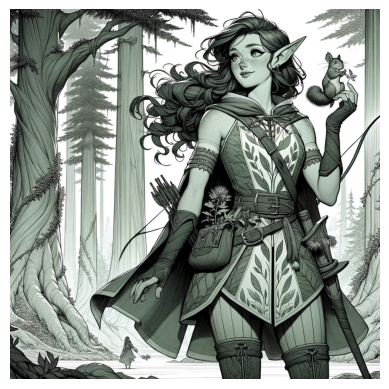

SketchAgent (to Color_manager):

Based on the following sketch description ### Sketch Description:
The sketch of Eldoria Evergreen presents her in a confident and dynamic stance, truly embodying her adventurous spirit and noble upbringing. She stands tall and poised on a sturdy branch in the Forest of Thaloria, her silhouette clearly defined against the backdrop of towering ancient trees. Eldoria's flowing, emerald-green hair cascades down her back, with a single lock twirled around her finger as she contemplates her next move. Her pointed ears are slightly twitching, signaling her excitement and curiosity.

Her outfit is intricately detailed, with a combination of practical and elegant elements reflecting her dual roles as a healer and a warrior. She wears a form-fitting, sleeveless tunic with elaborate leaf patterns woven into the fabric, paired with sturdy yet graceful leggings tucked into knee-high boots. Her waist is adorned with a small satchel of herbs, ready for immediate use. 

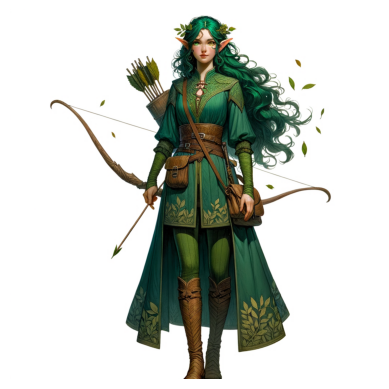

ColorAgent (to Refine_manager):

Based on the following character concept ### Personality Traits:
- Brave
- Curious
- Cheerful
- Adventurous
- Resourceful

### Backstory:
Eldoria Evergreen hails from the mystical Forest of Thaloria, a place where ancient trees touch the sky and wildlife thrives in harmony. Born to the wise elder, Lyren Evergreen, and the renowned herbalist, Elara Evergreen, Eldoria exhibited a special connection to nature from a young age. She learned the arts of healing and potion-making from her mother and honed her archery skills under her father's guidance. Her best friend, Thistle the squirrel, has been her constant companion on numerous expeditions through the forest. Eldoria's early life was filled with exploration, learning about different plant species, and understanding the intricate balance of the forest ecosystem.

### Motivations:
Eldoria is driven by a deep desire to protect Thaloria and its inhabitants from outside threats. Her curiosity propels her to d

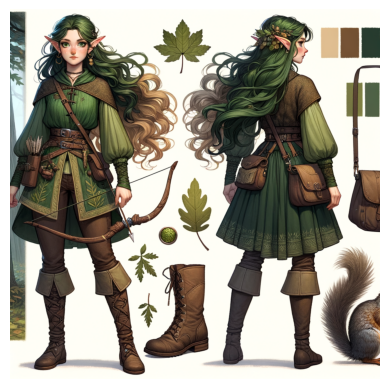

DALLE Creator! (to CriticAgent):

Critique the character design in the following image <image>, based on the concept, sketch, color choices, and details refinement provided by the team members.
        Provide feedback on how to improve the character's visual appeal, consistency, and alignment with the concept.
        

--------------------------------------------------------------------------------
CriticAgent (to DALLE Creator!):

This character design exhibits a remarkable combination of components, creating a visually appealing and coherent concept. Here is a critique along with suggestions on how to enhance the character's visual appeal, consistency, and alignment with the concept:

### Strengths:

1. **Concept and Genre Alignment:**
   - The character design effectively embodies the fantasy-genre aesthetic, fully utilizing elven traits like pointed ears and nature-inspired apparel, which aligns well with traditional fantasy archetypes.
   - Her attire and accessories, such as th

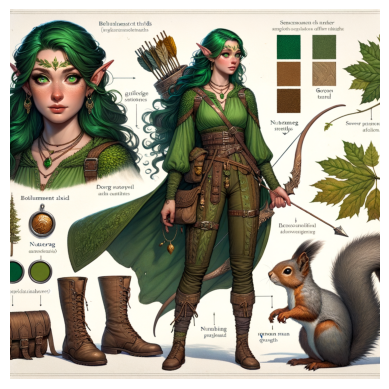

DALLE Creator! (to SituationAgent):

Create a vivid narrative scene for the coherent character in the following image: <image>, based on character description Generate a detailed, cohesive image of the forest elf character, Eldoria Evergreen, incorporating the following characteristics and enhancements:

1. **Emerald Green Hair (#50C878)**: Eldoria’s flowing hair should be rich emerald green with highlights and lowlights to create depth and movement. Capture the texture to make it look lifelike.

2. **Forest Green Outfit (#228B22)**: Her tunic and leggings should be deep forest green with detailed shading and texturing to enhance the practical and elegant design. Ensure her knee-high boots match the overall outfit.

3. **Nutmeg Brown Accessories (#8B4513)**: Her rugged leather boots and satchel should be in nutmeg brown, highlighting realistic wear and craftsmanship. Her bow should also feature nutmeg brown elements to showcase its wooden texture.

4. **Golden Yellow Accents (#FFD700)*

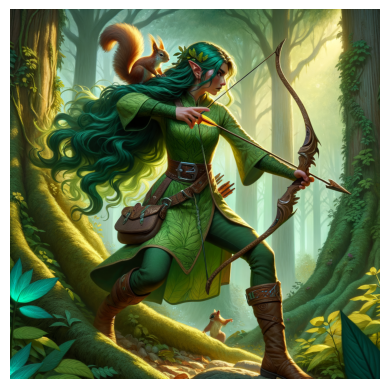

DALLE Creator! (to User):

result.jpg

--------------------------------------------------------------------------------


ChatResult(chat_id=None, chat_history=[{'content': 'Design an elf cartoon sytle.', 'role': 'assistant'}, {'content': 'result.jpg', 'role': 'user'}], summary='result.jpg', cost={'usage_including_cached_inference': {'total_cost': 0}, 'usage_excluding_cached_inference': {'total_cost': 0}}, human_input=[])

In [14]:
user_proxy = UserProxyAgent(name="User", human_input_mode="NEVER", max_consecutive_auto_reply=0)

user_proxy.initiate_chat(
    creator, message="""Design an elf cartoon sytle."""
)

User (to DALLE Creator!):

Design an everyday-working monkey realistic style.

--------------------------------------------------------------------------------
DALLE Creator! (to ConceptAgent):

Design an everyday-working monkey realistic style. Create a character concept based on the prompt provided. No more than 300 words.

--------------------------------------------------------------------------------
ConceptAgent (to DALLE Creator!):

### Character Concept: Oliver the Working Monkey

#### Personality Traits:
- Diligent
- Curious
- Resourceful
- Optimistic
- Sociable

#### Backstory:
Oliver was born in the dense rainforests of Borneo, but his unique knack for solving problems quickly set him apart from his troop. Discovered by a group of researchers as a young monkey, Oliver was brought to a primate rehabilitation center where his intelligence and curiosity shone brightly. Fascinated by human tools and machinery, Oliver began mimicking workers, astonishing everyone with his adaptab

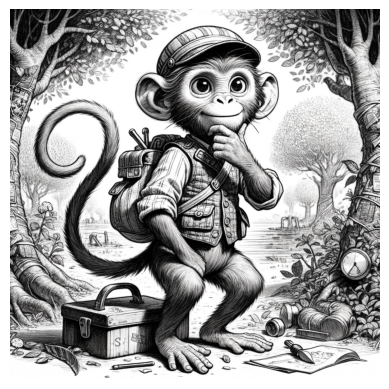

SketchAgent (to Color_manager):

Based on the following sketch description ### Sketch Description:
The sketch portrays Oliver the Working Monkey in a dynamic, engaging pose that captures his diligent and optimistic nature. Oliver stands upright on two legs, with his tail coiled around a nearby tree branch for support. His silhouette is dynamic and easy to recognize, emphasizing his agile, resourceful character. He wears a tiny, well-fitted worker’s vest with multiple pockets and a small brimmed hat that adds a charming touch. His face is expressive, with large, curious eyes and a small, confident smile, capturing his sociable and optimistic demeanor.

Oliver’s right hand is extended towards a toolbox, while his left hand holds a wrench, illustrating his fascination with human tools and machinery. His head is slightly tilted to the side, and his chin is being scratched thoughtfully, a mannerism reflecting his intelligent curiosity. A small pouch hangs on his side, filled with shiny trin

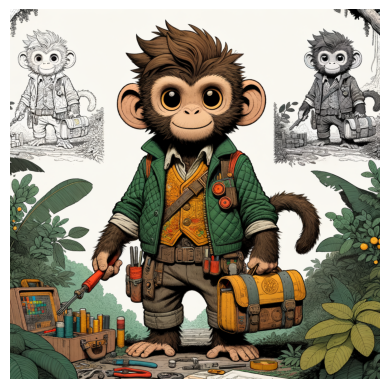

ColorAgent (to Refine_manager):

Based on the following character concept ### Character Concept: Oliver the Working Monkey

#### Personality Traits:
- Diligent
- Curious
- Resourceful
- Optimistic
- Sociable

#### Backstory:
Oliver was born in the dense rainforests of Borneo, but his unique knack for solving problems quickly set him apart from his troop. Discovered by a group of researchers as a young monkey, Oliver was brought to a primate rehabilitation center where his intelligence and curiosity shone brightly. Fascinated by human tools and machinery, Oliver began mimicking workers, astonishing everyone with his adaptability and sharp mind.

As he grew older, Oliver's talents were recognized by a conservation organization that partnered with local industries to promote eco-friendly practices. He was given tools and training to help with everyday tasks, such as sorting recyclable materials, planting trees, and even assisting with simple repairs in the facility. Over time, Oliver beca

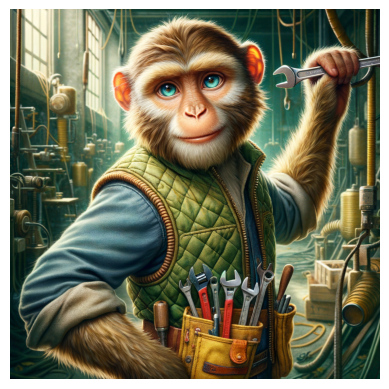

DALLE Creator! (to CriticAgent):

Critique the character design in the following image <image>, based on the concept, sketch, color choices, and details refinement provided by the team members.
        Provide feedback on how to improve the character's visual appeal, consistency, and alignment with the concept.
        

--------------------------------------------------------------------------------
CriticAgent (to DALLE Creator!):

The character design in the provided image is quite engaging and showcases a creative combination of anthropomorphized features and detailed realism. Let's break down the various aspects to provide constructive feedback:

### Concept:
The concept of a monkey mechanic is unique and shows a playful yet industrious theme. This anthropomorphic character merges the natural elements of a monkey with the technical and practical traits of a mechanic, creating a bridge between whimsical fantasy and relatable professions.

### Strengths:
1. **Expressive Face**: The 

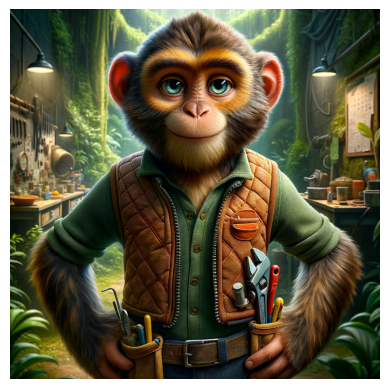

DALLE Creator! (to SituationAgent):

Create a vivid narrative scene for the coherent character in the following image: <image>, based on character description Create a detailed and vibrant image of Oliver the Working Monkey, integrating various enhancements and color elements to capture his industrious and conservation-focused persona.

### Core Color Palette:
1. **Warm Brown** (#8B4513) - Oliver's primary fur color, providing a natural and approachable look.
2. **Forest Green** (#228B22) - The color of Oliver's vest, symbolizing his connection to nature.
3. **Golden Yellow** (#FFD700) - Subtle highlights to add vibrancy and warmth.
4. **Toolbox Red** (#B22222) - For his small tools and gadgets, reflecting his industrious nature.
5. **Sky Blue** (#87CEEB) - Minor accents around his eyes, adding depth and calmness.

### Additional Elements:
- **Utility Belt/Satchel**: Dark Gray (#4B4B4B) to maintain practicality, featuring detailed small tools in toolbox red.
- **Vest Texture**: Subtle 

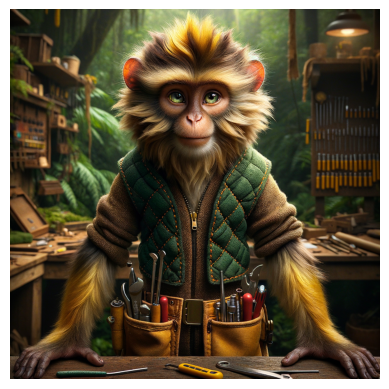

DALLE Creator! (to User):

result.jpg

--------------------------------------------------------------------------------


ChatResult(chat_id=None, chat_history=[{'content': 'Design an everyday-working monkey realistic style.', 'role': 'assistant'}, {'content': 'result.jpg', 'role': 'user'}], summary='result.jpg', cost={'usage_including_cached_inference': {'total_cost': 0}, 'usage_excluding_cached_inference': {'total_cost': 0}}, human_input=[])

In [20]:
user_proxy = UserProxyAgent(name="User", human_input_mode="NEVER", max_consecutive_auto_reply=0)

user_proxy.initiate_chat(
    creator, message="""Design an everyday-working monkey realistic style."""
)

User (to DALLE Creator!):

Design a flying witch video game style.

--------------------------------------------------------------------------------
DALLE Creator! (to ConceptAgent):

Design a flying witch video game style. Create a character concept based on the prompt provided. No more than 300 words.

--------------------------------------------------------------------------------
ConceptAgent (to DALLE Creator!):

### Personality Traits: 
- **Adventurous**: Always seeking new horizons and uncharted skies.
- **Cheerful**: Maintains an upbeat attitude even in dire situations.
- **Resourceful**: Finds creative solutions with limited resources.
- **Brave**: Faces dangers head-on with fearless determination.

### Backstory:
Sylvara Windwhisper hails from Nimbus Hollow, a hidden village amidst the clouds, where the art of flying magic has been passed down for generations. Born to a family of accomplished aerial mages, Sylvara showed an extraordinary affinity for the skies from a young ag

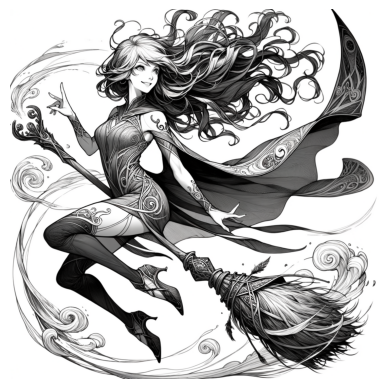

SketchAgent (to Color_manager):

Based on the following sketch description ### Sketch Description:
The sketch will feature Sylvara Windwhisper, presented in a dynamic mid-flight pose. Her silhouette, slender yet athletic, conveys agility and grace. Her long, wavy hair flows wildly with a life of its own, reflecting the storm magic she wields. She's dressed in a form-fitting, intricately detailed mage outfit with cloak-like elements flowing behind her, giving the impression of motion and wind. 

Sylvara's expression is one of determined cheerfulness, her eyes wide and scanning, suggesting both confidence and an untiring wonder for the skies she navigates. Her right hand grips her uniquely designed broom, Tempestweaver, a sleek, elegant artifact adorned with storm motifs, such as swirling clouds and lightning bolts. Her left hand is outstretched, fingers splayed as though she is either casting a spell or feeling the breeze.

Key features of the sketch include her rhythmic tapping fingers

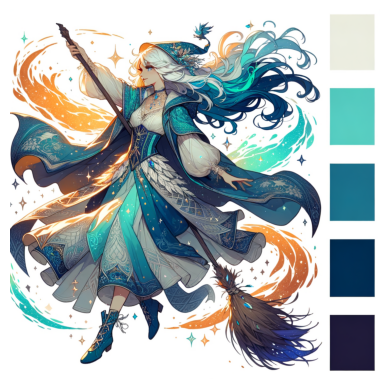

ColorAgent (to Refine_manager):

Based on the following character concept ### Personality Traits: 
- **Adventurous**: Always seeking new horizons and uncharted skies.
- **Cheerful**: Maintains an upbeat attitude even in dire situations.
- **Resourceful**: Finds creative solutions with limited resources.
- **Brave**: Faces dangers head-on with fearless determination.

### Backstory:
Sylvara Windwhisper hails from Nimbus Hollow, a hidden village amidst the clouds, where the art of flying magic has been passed down for generations. Born to a family of accomplished aerial mages, Sylvara showed an extraordinary affinity for the skies from a young age. Her mother, Liora, is the high chancellor of Nimbus Hollow, leading the council of sky witches, while her father, Eryndor, crafts enchanted brooms imbued with elemental magic.

At ten, Sylvara's world tilted when a tempest demon attacked Nimbus Hollow, leaving her best friend Velar in a magical coma. Determined to find a cure, she ventured acr

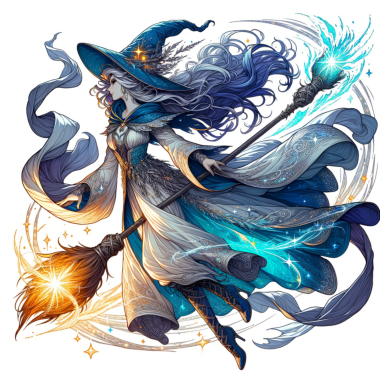

DALLE Creator! (to CriticAgent):

Critique the character design in the following image <image>, based on the concept, sketch, color choices, and details refinement provided by the team members.
        Provide feedback on how to improve the character's visual appeal, consistency, and alignment with the concept.
        

--------------------------------------------------------------------------------
CriticAgent (to DALLE Creator!):

The character design presented is visually compelling and evocative of a magical, fantasy-themed concept. Here's a detailed critique focusing on aspects such as the concept, sketch, color choices, and details refinement:

### **Concept:**
The character embodies an archetypal fantasy mage or sorceress, with clear elements that signify enchantment and mystical abilities. The dynamic pose and flowing garments suggest movement, imbuing a sense of otherworldly grace and power. The intricately designed staff and broom further emphasize her magical nature.

### *

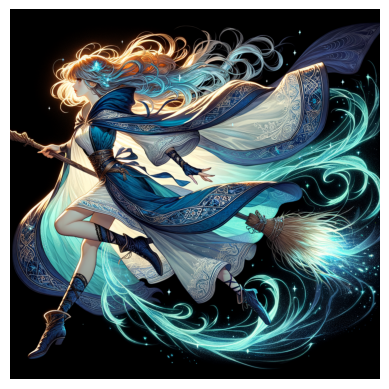

DALLE Creator! (to SituationAgent):

Create a vivid narrative scene for the coherent character in the following image: <image>, based on character description Create an illustration of Sylvara Windwhisper, a dynamic and enchanting character, shown mid-flight on her broomstick, exuding magical energy. Utilize Storm Blue and Vibrant Turquoise tones for her garments to emphasize her storm magic and energetic presence. Her flowing cloak, crafted from lightweight silk, should flutter gracefully around her, while her boots and gloves are made of durable enchanted leather for a touch of realism.

Her eyes and the magical sparks she emits should alternate between Blazing Orange and Bright Yellow to add warmth and cheerfulness. Outline her cascading hair and flowing cloak with White and Silver for an elegant touch, complemented by Dark Navy and Deep Purple outlines to enhance her silhouette in high-contrast environments.

Incorporate Pale Gold accents subtly on the edges of her cloak and intric

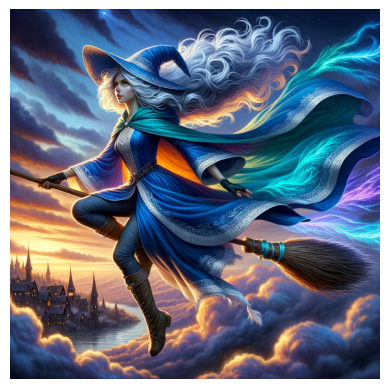

DALLE Creator! (to User):

result.jpg

--------------------------------------------------------------------------------


ChatResult(chat_id=None, chat_history=[{'content': 'Design a flying witch video game style.', 'role': 'assistant'}, {'content': 'result.jpg', 'role': 'user'}], summary='result.jpg', cost={'usage_including_cached_inference': {'total_cost': 0}, 'usage_excluding_cached_inference': {'total_cost': 0}}, human_input=[])

In [26]:
user_proxy = UserProxyAgent(name="User", human_input_mode="NEVER", max_consecutive_auto_reply=0)

user_proxy.initiate_chat(
    creator, message="""Design a flying witch video game style."""
)

User (to DALLE Creator!):

Design a lovely girl in children's book style.

--------------------------------------------------------------------------------
DALLE Creator! (to ConceptAgent):

Design a lovely girl in children's book style. Create a character concept based on the prompt provided. No more than 300 words.

--------------------------------------------------------------------------------
ConceptAgent (to DALLE Creator!):

### Personality Traits:
- Cheerful
- Inquisitive
- Kind-hearted
- Imaginative

### Backstory:
Lila Blossom is an eight-year-old girl who lives in the vibrant, cozy village of Willowbrook, surrounded by a tapestry of colorful meadows and sparkling streams. She was born to loving parents who run the village's small, delightful bookstore. Growing up among the towering shelves of books, Lila developed a boundless imagination and a deep love for stories. Her best friend is a fluffy, adventurous rabbit named Pippin, who she found injured in the woods one stormy ni

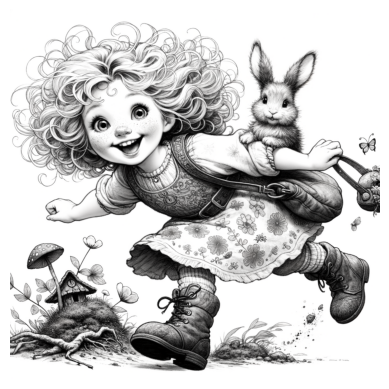

SketchAgent (to Color_manager):

Based on the following sketch description ### Sketch Description:

The sketch portrays Lila Blossom, an eight-year-old girl with a joyful and whimsical aura. She stands mid-step, capturing her energetic and imaginative spirit. Lila's silhouette is dynamic, with her body slightly leaning forward as if she's about to embark on a new adventure. Her hair, a cascade of golden curls, frames her round face, and several locks sway with her movement, suggesting her perpetual curiosity. Lila’s sparkling eyes are large and expressive, wide with excitement and wonder. Her mouth forms a broad, delighted smile.

Lila wears a simple, yet charming dress that falls just below her knees. The dress is adorned with small flower patterns, emphasizing her connection to nature and her village’s meadows. She pairs it with sturdy, practical boots suitable for her frequent outdoor explorations. Over her shoulder is a small satchel, hinting at her preparedness for discovering new

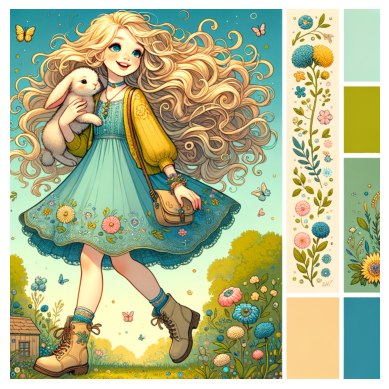

ColorAgent (to Refine_manager):

Based on the following character concept ### Personality Traits:
- Cheerful
- Inquisitive
- Kind-hearted
- Imaginative

### Backstory:
Lila Blossom is an eight-year-old girl who lives in the vibrant, cozy village of Willowbrook, surrounded by a tapestry of colorful meadows and sparkling streams. She was born to loving parents who run the village's small, delightful bookstore. Growing up among the towering shelves of books, Lila developed a boundless imagination and a deep love for stories. Her best friend is a fluffy, adventurous rabbit named Pippin, who she found injured in the woods one stormy night and nursed back to health. Together, they embark on daily adventures, exploring enchanted forests, mysterious caves, and hidden groves around their village. One of her favorite activities is creating tiny elaborate fairy houses out of twigs, moss, and petals, hoping to befriend the magical creatures she believes dwell in Willowbrook.

### Motivations:
Lila

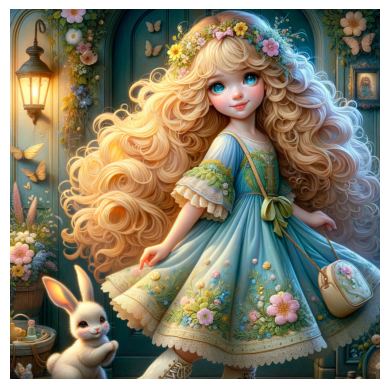

DALLE Creator! (to CriticAgent):

Critique the character design in the following image <image>, based on the concept, sketch, color choices, and details refinement provided by the team members.
        Provide feedback on how to improve the character's visual appeal, consistency, and alignment with the concept.
        

--------------------------------------------------------------------------------
CriticAgent (to DALLE Creator!):

This character design is enchanting, capturing a whimsical, fairy-tale essence beautifully. Here are some detailed areas of feedback and suggestions for improvement:

### Concept and Character Consistency:
- **Concept Clarity**: The concept of a young, ethereal girl in a fairy-tale-like setting is well-reflected in the design. The large, expressive eyes, floral accents, flowing dress, and engaging companion (the bunny) create a cohesive, charming narrative.
- **Consistency**: The character consistently embodies an innocent, magical vibe. This aligns well w

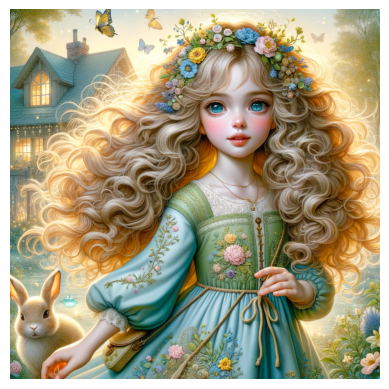

DALLE Creator! (to SituationAgent):

Create a vivid narrative scene for the coherent character in the following image: <image>, based on character description Generate a highly detailed and enchanting artistic rendition of a young girl named Lila Blossom, incorporating the specified color palette. Lila has cascading curls of sunny yellow (#F2D743) hair with gentle gradients and highlights, creating a soft, bouncy texture that reflects her joyful and lively nature. Her hair should appear voluminous and grandiose, fitting the fairy-tale essence of her character.

Lila's dress is predominantly sky blue (#61A4D0) with intricate floral green (#8BC34A) patterns and blossom pink (#F4A7B9) embroideries along the hem and neckline, accented with delicate golden details. This combination highlights her deep connection to nature and adds visual appeal, reinforcing the whimsical and magical vibe.

Her facial features should radiate youthful exuberance with large, expressive eyes that have sparkles 

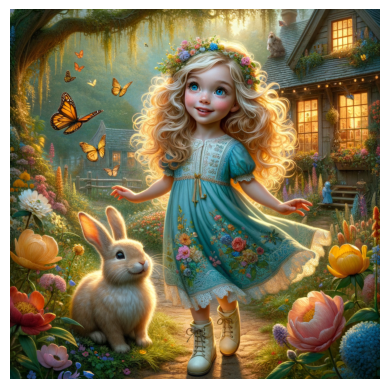

DALLE Creator! (to User):

result.jpg

--------------------------------------------------------------------------------


ChatResult(chat_id=None, chat_history=[{'content': "Design a lovely girl in children's book style.", 'role': 'assistant'}, {'content': 'result.jpg', 'role': 'user'}], summary='result.jpg', cost={'usage_including_cached_inference': {'total_cost': 0}, 'usage_excluding_cached_inference': {'total_cost': 0}}, human_input=[])

In [30]:
user_proxy = UserProxyAgent(name="User", human_input_mode="NEVER", max_consecutive_auto_reply=0)

user_proxy.initiate_chat(
    creator, message="""Design a lovely girl in children's book style."""
)

User (to DALLE Creator!):

Design a character.

--------------------------------------------------------------------------------
DALLE Creator! (to ConceptAgent):

Design a character. Create a character concept based on the prompt provided. No more than 300 words.

--------------------------------------------------------------------------------
ConceptAgent (to DALLE Creator!):

### Character Concept: Lina "Stormblade" Aeredale

**Personality Traits:**
- Brave
- Resourceful
- Compassionate
- Adventurous
- Quick-witted

**Backstory:**
Lina Aeredale hails from the coastal village of Brighthaven, a place known for its powerful thunderstorms and lush landscapes. As a child, Lina was always fascinated by the storms, believing them to be the whispers of ancient spirits. Her father, a blacksmith, and her mother, a healer, combined their skills to teach her both the art of crafting and the wisdom of nature.

At 14, tragedy struck when pirates attacked Brighthaven, leading to the loss of her pa

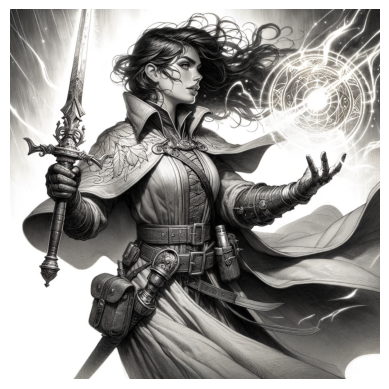

SketchAgent (to Color_manager):

Based on the following sketch description ### Sketch Description:
The sketch depicts Lina "Stormblade" Aeredale in a dynamic, mid-action pose. She stands tall with a firm, commanding presence, her silhouette framed by the billowing edges of her long coat, reminiscent of a stormy sea. Her gaze is intense and focused, conveying her bravery and determination. Lina's hair is tousled by the wind, with a few strands falling over her face, reflecting her adventurous spirit.

She's dressed in practical yet intricate attire: fitted leather armor adorned with subtle, nature-inspired patterns like vines and leaves, representing her mother's wisdom of nature. Her sword, a beautiful blend of craftsmanship and enchantment, gleams with an ethereal glow, symbolizing both her father’s blacksmithing skills and her mother's magical touch. The sword's hilt is detailed, with runes etched into the metal.

Lina's left hand is poised to cast a spell, fingers spread wide and gl

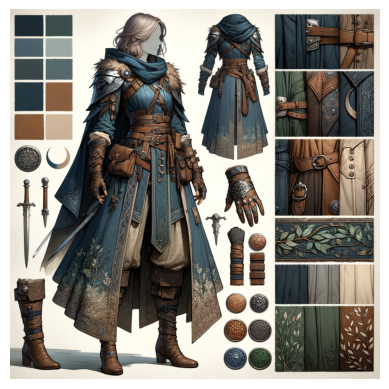

ColorAgent (to Refine_manager):

Based on the following character concept ### Character Concept: Lina "Stormblade" Aeredale

**Personality Traits:**
- Brave
- Resourceful
- Compassionate
- Adventurous
- Quick-witted

**Backstory:**
Lina Aeredale hails from the coastal village of Brighthaven, a place known for its powerful thunderstorms and lush landscapes. As a child, Lina was always fascinated by the storms, believing them to be the whispers of ancient spirits. Her father, a blacksmith, and her mother, a healer, combined their skills to teach her both the art of crafting and the wisdom of nature.

At 14, tragedy struck when pirates attacked Brighthaven, leading to the loss of her parents. Vowing to protect others from such fate, Lina took up her father’s sword, imbued with her mother's enchantments. She trained rigorously, adopting the moniker "Stormblade" for her agility and combat flair, reminiscent of a lightning strike.

In her travels, Lina formed a significant bond with a young 

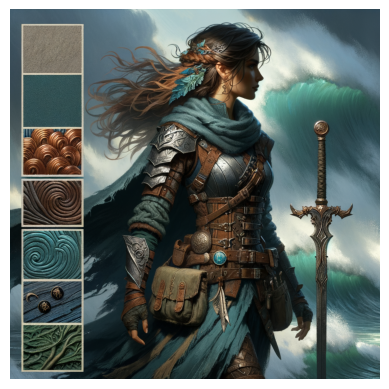

DALLE Creator! (to CriticAgent):

Critique the character design in the following image <image>, based on the concept, sketch, color choices, and details refinement provided by the team members.
        Provide feedback on how to improve the character's visual appeal, consistency, and alignment with the concept.
        

--------------------------------------------------------------------------------
CriticAgent (to DALLE Creator!):

This character design showcases a well-developed and visually captivating figure, blending fantasy and practicality in an appealing manner. Let’s break down the analysis into several key aspects:

### Concept and Genre Alignment:
The design carries a strong sense of fantasy and adventure. The use of armor, intricate detail, and natural elements like feathers suggests a character who is both a warrior and in tune with nature. This alignment with a fantasy genre is quite well-executed.

### Color Choices:
The color palette is predominantly cool tones of teal

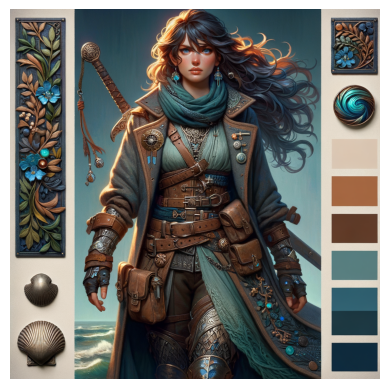

DALLE Creator! (to SituationAgent):

Create a vivid narrative scene for the coherent character in the following image: <image>, based on character description ### Refined Prompt for DALL-E 3

Create a highly detailed and colored image of a female warrior-mage named Lina "Stormblade" Aeredale in a fantasy setting, highlighting both her battle-hardened experience and magical prowess with the following enhancements:

**Textures and Fine Details:**
- **Leather Armor:** Incorporate a grain texture for a weathered, worn look, emphasizing Lina's numerous battles and adventures. Add three-dimensional nature-inspired patterns (vines and leaves) on the armor.
- **Sword Hilt:** Make runes on the hilt more visible with a subtle ethereal glow, emphasizing the sword’s enchanted craftsmanship.
- **Utility Belt and Pouches:** Introduce subtle wear and fraying to convey frequent usage, reinforcing Lina’s resourcefulness.

**Shading and Lighting:**
- **Dynamic Lighting:** Amplify the lighting effects on

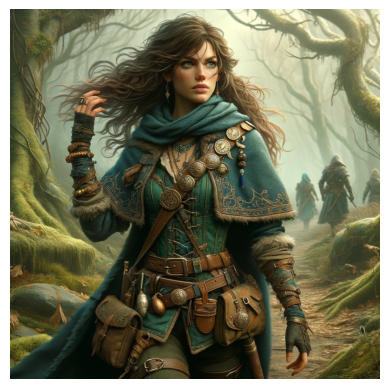

DALLE Creator! (to User):

result.jpg

--------------------------------------------------------------------------------


ChatResult(chat_id=None, chat_history=[{'content': 'Design a character.', 'role': 'assistant'}, {'content': 'result.jpg', 'role': 'user'}], summary='result.jpg', cost={'usage_including_cached_inference': {'total_cost': 0}, 'usage_excluding_cached_inference': {'total_cost': 0}}, human_input=[])

In [11]:
user_proxy = UserProxyAgent(name="User", human_input_mode="NEVER", max_consecutive_auto_reply=0)

user_proxy.initiate_chat(
    creator, message="""Design a character."""
)

User (to DALLE Creator!):

Design a superhero who can manipulate time, using their abilities to stop crime before it happens. This hero is a former scientist who gained powers after a failed experiment, and now they struggle with the ethical dilemmas of altering timelines. Their costume should reflect a sleek, futuristic design, and they must balance their role as a protector with the consequences of meddling with fate.

--------------------------------------------------------------------------------
DALLE Creator! (to ConceptAgent):

Design a superhero who can manipulate time, using their abilities to stop crime before it happens. This hero is a former scientist who gained powers after a failed experiment, and now they struggle with the ethical dilemmas of altering timelines. Their costume should reflect a sleek, futuristic design, and they must balance their role as a protector with the consequences of meddling with fate. Create a character concept based on the prompt provided. No mo

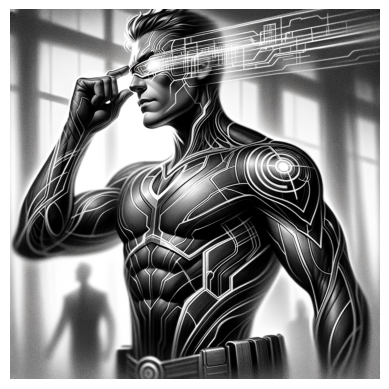

SketchAgent (to Color_manager):

Based on the following sketch description ### Sketch Description:
The sketch depicts Dr. Adrien Tempus, now the Chrono Sentinel, standing tall in a dynamic and assertive pose. The silhouette is sleek and powerful, with a streamlined, form-fitting bodysuit that hugs their frame, giving off an aura of agility and strength. The bodysuit is adorned with intricate, luminous, circuit-like patterns that zigzag across the form, casting a soft glow even in monochrome.

Chrono Sentinel’s retractable visor is pulled down, covering half of their stern yet contemplative face. The visor is integrated seamlessly with the suit, displaying a grid of temporal data, emphasizing their analytical nature. Adrien’s expression is a focused, thousand-yard stare, lips slightly parted as if whispering a cryptic phrase about time and consequence.

Adrien’s left hand gently adjusts an unseen pair of glasses, a reflective gesture from their past, while the right hand holds a small, 

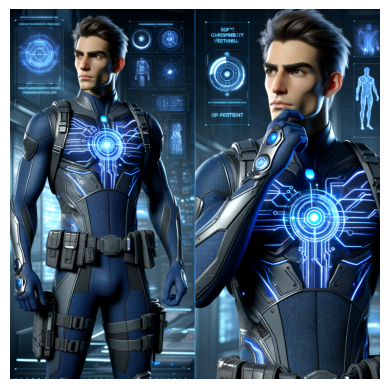

ColorAgent (to Refine_manager):

Based on the following character concept ### Personality Traits: 
- Empathetic
- Analytical
- Cautious
- Determined
- Reflective

### Backstory:
Dr. Adrien Tempus, once a renowned physicist, dedicated their life to the study of temporal mechanics. Born to a single mother who instilled the values of perseverance and empathy, Adrien excelled in academics, eventually securing a position at a leading research institute. Fascinated by the possibility of time manipulation for the betterment of humanity, Adrien initiated an ambitious project to develop a time-manipulation device. However, a catastrophic lab accident fused the experimental technology with Adrien's body, granting them the unprecedented ability to manipulate time.

Haunted by memories of the accident and the ethical implications of their powers, Adrien took on the alter-ego "Chrono Sentinel." With each intervention, Adrien faces the moral ambiguity of altering timelines and the potential unintend

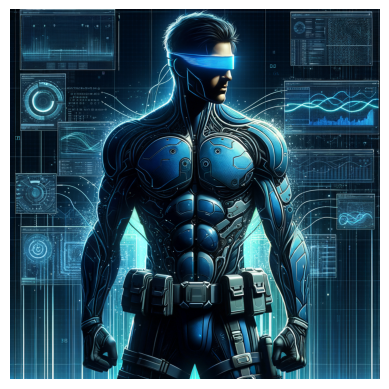

DALLE Creator! (to CriticAgent):

Critique the character design in the following image <image>, based on the concept, sketch, color choices, and details refinement provided by the team members.
        Provide feedback on how to improve the character's visual appeal, consistency, and alignment with the concept.
        

--------------------------------------------------------------------------------
CriticAgent (to DALLE Creator!):

The character design in the provided image portrays a futuristic, technologically advanced individual with a distinct sci-fi flair. Here is a detailed critique, along with suggestions for improvement:

### Concept
- **Strengths**: The concept of a high-tech, futuristic character is compelling, capturing the essence of a cutting-edge sci-fi universe. The advanced technology integrated into the character's suit and accessories denotes a strong, formidable presence.
- **Suggestions**: Consider providing more context or backstory subtly through the design, suc

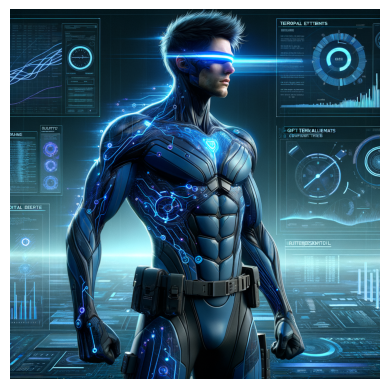

DALLE Creator! (to SituationAgent):

Create a vivid narrative scene for the coherent character in the following image: <image>, based on character description Create an advanced and detailed illustration of **Chrono Sentinel (Dr. Adrien Tempus)** in a high-tech lab environment. Adrien wears a form-fitting bodysuit in **Deep Midnight Blue (#001F3F)**, highlighting his muscular build and mysterious aura. The suit features intricate **Electric Blue (#00AEFF)** circuit patterns with a gradient effect, signifying the fluidity of time. **Steely Grey (#3A3A3A)** utility belt and gadgets blend seamlessly with the suit, emphasizing tech functionality. **Soft Glow White (#F0F0F0)** highlights add an ethereal glow, suggesting the continuous flow of time and energy through his body. 

The visor, tinted in **Light Cyan (#8EF6E4)**, displays complex temporal data overlays, including temporal graphs, multidimensional heat maps, and branching timelines. Graphic elements on the visor reinforce his anal

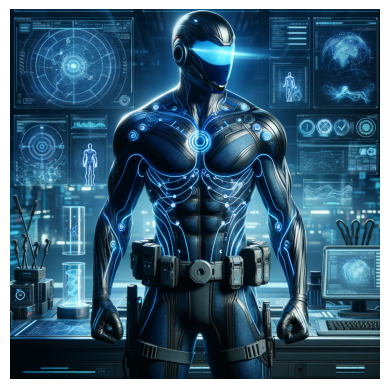

DALLE Creator! (to User):

result.jpg

--------------------------------------------------------------------------------


ChatResult(chat_id=None, chat_history=[{'content': 'Design a superhero who can manipulate time, using their abilities to stop crime before it happens. This hero is a former scientist who gained powers after a failed experiment, and now they struggle with the ethical dilemmas of altering timelines. Their costume should reflect a sleek, futuristic design, and they must balance their role as a protector with the consequences of meddling with fate.', 'role': 'assistant'}, {'content': 'result.jpg', 'role': 'user'}], summary='result.jpg', cost={'usage_including_cached_inference': {'total_cost': 0}, 'usage_excluding_cached_inference': {'total_cost': 0}}, human_input=[])

In [12]:
user_proxy = UserProxyAgent(name="User", human_input_mode="NEVER", max_consecutive_auto_reply=0)

user_proxy.initiate_chat(
    creator, message="""Design a superhero who can manipulate time, using their abilities to stop crime before it happens. This hero is a former scientist who gained powers after a failed experiment, and now they struggle with the ethical dilemmas of altering timelines. Their costume should reflect a sleek, futuristic design, and they must balance their role as a protector with the consequences of meddling with fate."""
)

User (to DALLE Creator!):

Design a similar character based on the input image: <img /workspaces/autogen/notebook/Po_Kung_Fu_Panda.jpg>
    

--------------------------------------------------------------------------------
DALLE Creator! (to ConceptAgent):

Design a similar character based on the input image: <image>
     Create a character concept based on the prompt provided. No more than 300 words.

--------------------------------------------------------------------------------
ConceptAgent (to DALLE Creator!):

### Character Concept: Ryzo the Raccoon

#### Personality Traits: 
- Playful
- Clever
- Resourceful
- Fiercely loyal
- Slightly mischievous

#### Backstory:
Ryzo grew up in the bustling, ancient city of Chenbao, known for its diverse inhabitants and deep-rooted traditions. As a young raccoon, Ryzo lived with his adoptive family, the Zephers, who were renowned acrobats in the city's famous circus. Despite his small size and mischievous nature, Ryzo demonstrated exceptional a

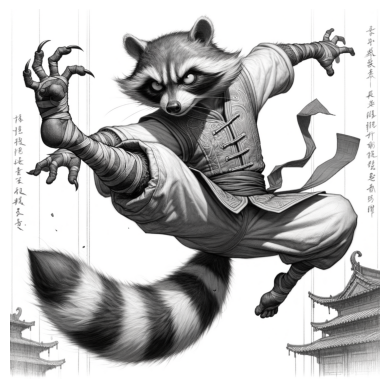

SketchAgent (to Color_manager):

Based on the following sketch description ### Sketch Description:
The sketch of Ryzo the Raccoon captures him in a dynamic and agile pose, mid-air, performing a complex acrobatic maneuver. His silhouette is sleek and fluid, highlighting his nimble physique. His head is slightly tilted, with an expression of fierce determination mixed with a sparkle of mischief in his eyes. Ryzo's raccoon features are prominent, with detailed emphasis on his masked face, bushy tail, and clawed paws.

He wears a fitted, circus-inspired costume with flowing elements reminiscent of traditional Chenbao garments integrated with practical acrobat attire. His costume includes a snug vest adorned with subtle patterns and a sash tied around his waist, tails of which flutter dramatically in the air. His pants are tapered, allowing ease of movement. Ryzo’s hands, mid-motion, showcase his dexterity, with extended claws ready to interact with his environment. His tail arcs upward, ad

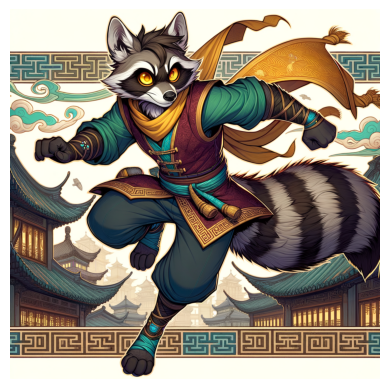

ColorAgent (to Refine_manager):

Based on the following character concept ### Character Concept: Ryzo the Raccoon

#### Personality Traits: 
- Playful
- Clever
- Resourceful
- Fiercely loyal
- Slightly mischievous

#### Backstory:
Ryzo grew up in the bustling, ancient city of Chenbao, known for its diverse inhabitants and deep-rooted traditions. As a young raccoon, Ryzo lived with his adoptive family, the Zephers, who were renowned acrobats in the city's famous circus. Despite his small size and mischievous nature, Ryzo demonstrated exceptional agility and a knack for solving problems. His early years were filled with rigorous training, street performances, and the endless pursuit of the next big adventure.

At the age of 15, a mysterious event scattered his family, leading Ryzo to embark on a quest to reunite with them. Along the way, he encountered a wise old red panda named Master Fong, who recognized Ryzo's potential and took him under his wing, teaching him the ancient art of Spir

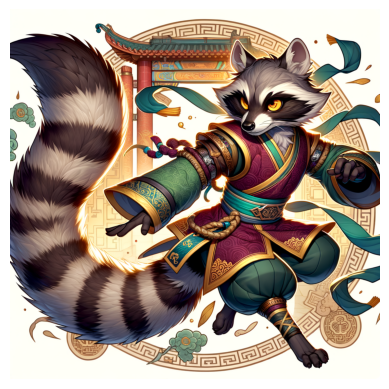

DALLE Creator! (to CriticAgent):

Critique the character design in the following image <image>, based on the concept, sketch, color choices, and details refinement provided by the team members.
        Provide feedback on how to improve the character's visual appeal, consistency, and alignment with the concept.
        

--------------------------------------------------------------------------------
CriticAgent (to DALLE Creator!):

The character design is visually striking and loaded with potential. Here are some detailed observations and actionable suggestions for improvement:

### Concept and Sketch
1. **Strengths**: The concept of a raccoon character dressed in ornate, Asian-inspired martial arts attire is both unique and engaging. The dynamic pose suggests action and agility, which fits well with the martial arts theme.
2. **Improvements**: The sketch conveys energy, but the proportions, especially the size of the hands and feet, could be adjusted slightly for greater consistency

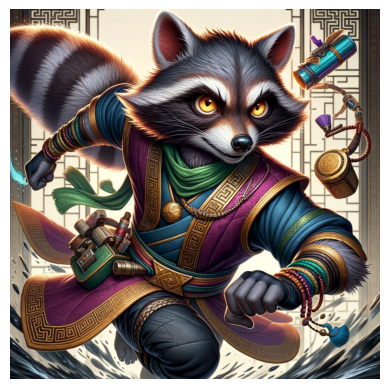

DALLE Creator! (to SituationAgent):

Create a vivid narrative scene for the coherent character in the following image: <image>, based on character description ### Prompt for DALL-E 3:

Create a highly detailed and vibrant illustration of Ryzo the raccoon, integrating final design refinements and color palette elements. Ryzo should be illustrated in an energetic and dynamic pose, showcasing his agility and playfulness, set against a backdrop featuring traditional Chinese architecture.

1. **Costume**:
   - **Deep Maroon (#800000)** vest and sash for primary costume elements, creating a rich contrast.
   - **Jade Green (#00A36C)** accents on the vest and sash for a refreshing touch.
   - **Golden Yellow (#FFC300)** patterns and highlights on the costume to enhance vibrancy.
   - **Light Tan (#D2B48C)** for additional minor details and highlights, ensuring balanced visibility.
   - Incorporate cultural emblems from Chenbao subtly into the sash design for a deeper cultural context.

2. **F

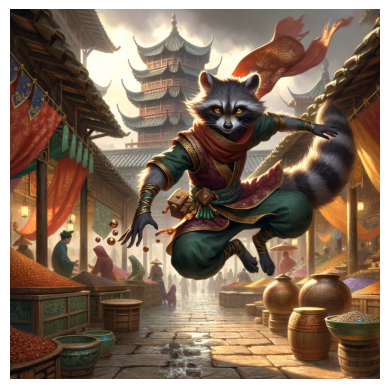

DALLE Creator! (to User):

result.jpg

--------------------------------------------------------------------------------


ChatResult(chat_id=None, chat_history=[{'content': 'Design a similar character based on the input image: <img /workspaces/autogen/notebook/Po_Kung_Fu_Panda.jpg>\n    ', 'role': 'assistant'}, {'content': 'result.jpg', 'role': 'user'}], summary='result.jpg', cost={'usage_including_cached_inference': {'total_cost': 0}, 'usage_excluding_cached_inference': {'total_cost': 0}}, human_input=[])

In [12]:
user_proxy = UserProxyAgent(name="User", human_input_mode="NEVER", max_consecutive_auto_reply=0)

user_proxy.initiate_chat(
    creator, message="""Design a similar character based on the input image: <img /workspaces/autogen/notebook/Po_Kung_Fu_Panda.jpg>
    """
)